In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ",TORCH_VERSION, "; CUDA: ",CUDA_VERSION)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch:  2.5 ; CUDA:  cu121


In [2]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-pzt_9fe9
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-pzt_9fe9
  Resolved https://github.com/facebookresearch/detectron2.git to commit c69939aa85460e8135f40bce908a6cddaa73065f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 58.3 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

In [3]:
import detectron2

from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os,json,cv2,random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [4]:
!curl -L "https://universe.roboflow.com/ds/1htafqs1OP?key=3hyXXKgt6Q" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   2311      0 --:--:-- --:--:-- --:--:--  2313
100 45.4M  100 45.4M    0     0  22.4M      0  0:00:02  0:00:02 --:--:-- 41.8M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/1009_jpg.rf.69bf446ed5d17828b7eec8f13442baf7.jpg  
 extracting: test/1030_jpg.rf.457d4fb41fceed8015a48c43aabb6312.jpg  
 extracting: test/1031_jpg.rf.39a7047cd7b5894a659a4c92da70e5e0.jpg  
 extracting: test/1035_jpg.rf.0ecae43b2b6cec54bf608e30c383cb46.jpg  
 extracting: test/1044_jpg.rf.8875343b5b56460637f65601d193c39d.jpg  
 extracting: test/1045_jpg.rf.af32b662ea9c0ba35989900103db28d6.jpg  
 extracting: test/1047_jpg.rf.06b5ea9b6f3945b3bc2bd3306d041dcc.jpg  
 extracting: test/1053_jpg.rf.331e86520d9ff986b6e09ef93003835a.jpg  
 extracting: t

In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train",{},"/content/train/_annotations.coco.json","/content/train")
register_coco_instances("my_dataset_test",{},"/content/test/_annotations.coco.json","/content/test")

WARNING [11/27 05:20:50 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/27 05:20:50 d2.data.datasets.coco]: Loaded 675 images in COCO format from /content/train/_annotations.coco.json


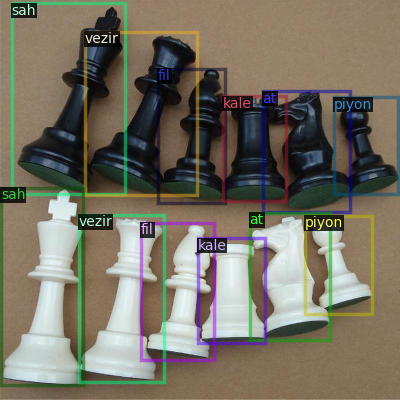

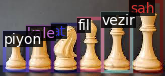

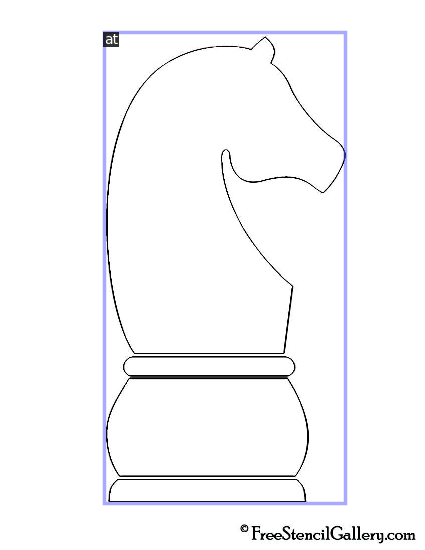

In [6]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [7]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[11/27 05:22:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 99.5MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[11/27 05:22:09 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/27 05:22:23 d2.utils.events]:  eta: 0:03:16  iter: 19  total_loss: 2.267  loss_cls: 1.772  loss_box_reg: 0.5659  loss_rpn_cls: 0.001268  loss_rpn_loc: 0.01114    time: 0.4122  last_time: 0.3798  data_time: 0.0239  last_data_time: 0.0050   lr: 9.7405e-05  max_mem: 2545M
[11/27 05:22:35 d2.utils.events]:  eta: 0:03:17  iter: 39  total_loss: 1.294  loss_cls: 0.6702  loss_box_reg: 0.6071  loss_rpn_cls: 0.001613  loss_rpn_loc: 0.008693    time: 0.4211  last_time: 0.4273  data_time: 0.0217  last_data_time: 0.0079   lr: 0.00019731  max_mem: 2636M
[11/27 05:22:43 d2.utils.events]:  eta: 0:03:03  iter: 59  total_loss: 1.283  loss_cls: 0.5847  loss_box_reg: 0.6883  loss_rpn_cls: 0.002326  loss_rpn_loc: 0.0141    time: 0.4144  last_time: 0.4173  data_time: 0.0125  last_data_time: 0.0063   lr: 0.0002972  max_mem: 2636M
[11/27 05:22:51 d2.utils.events]:  eta: 0:02:56  iter: 79  total_loss: 1.161  loss_cls: 0.4741  loss_box_reg: 0.6614  loss_rpn_cls: 0.0009025  loss_rpn_loc: 0.01062    time: 0.4

In [8]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[11/27 05:35:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [12]:
test_metadata = MetadataCatalog.get("my_dataset_test")

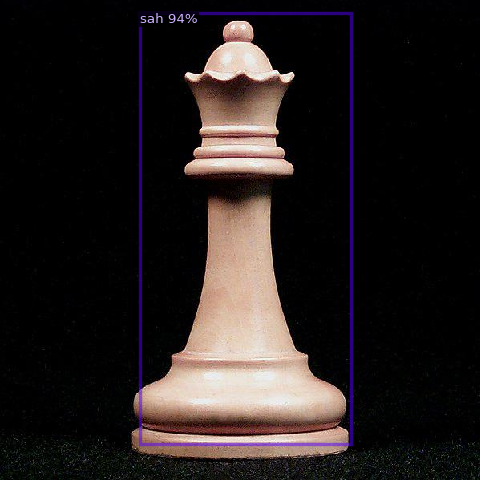

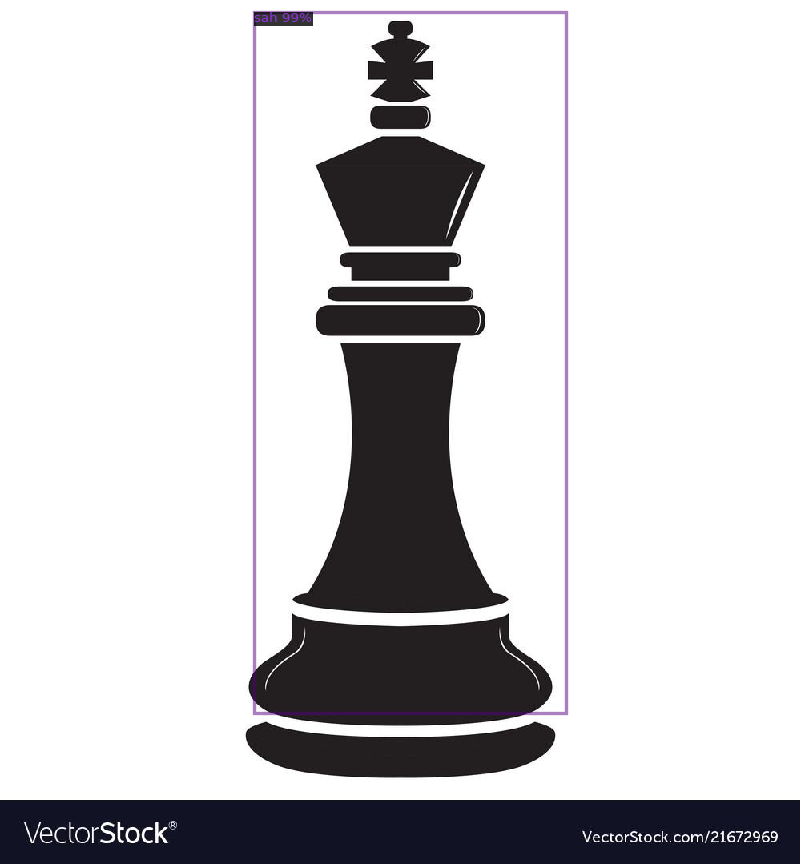

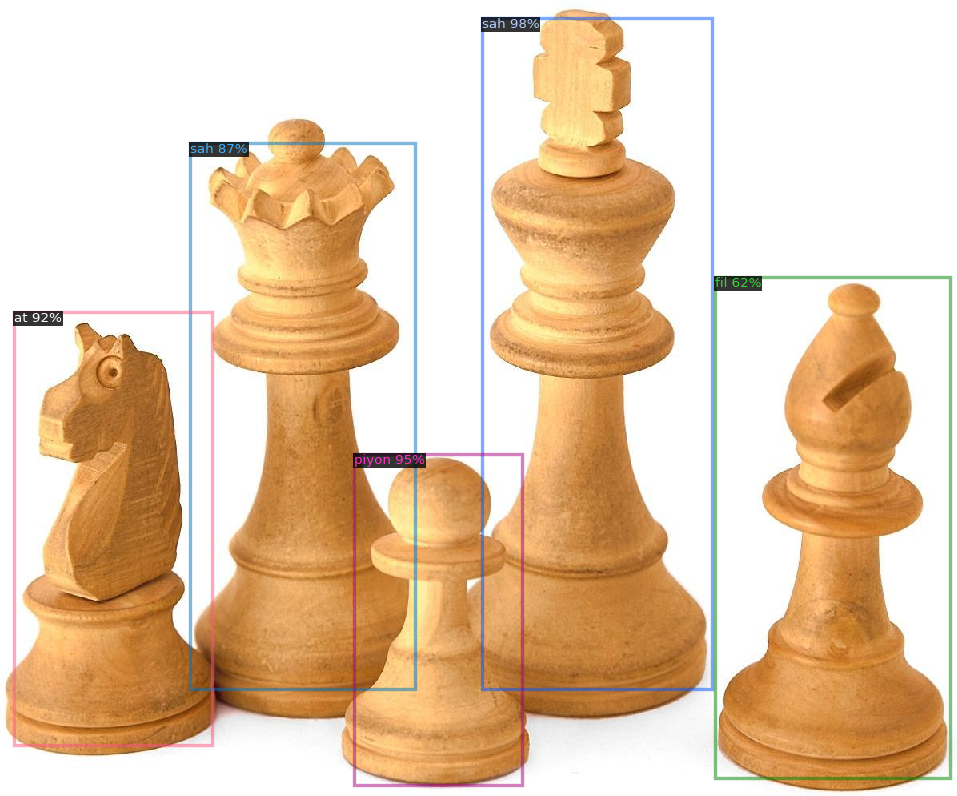

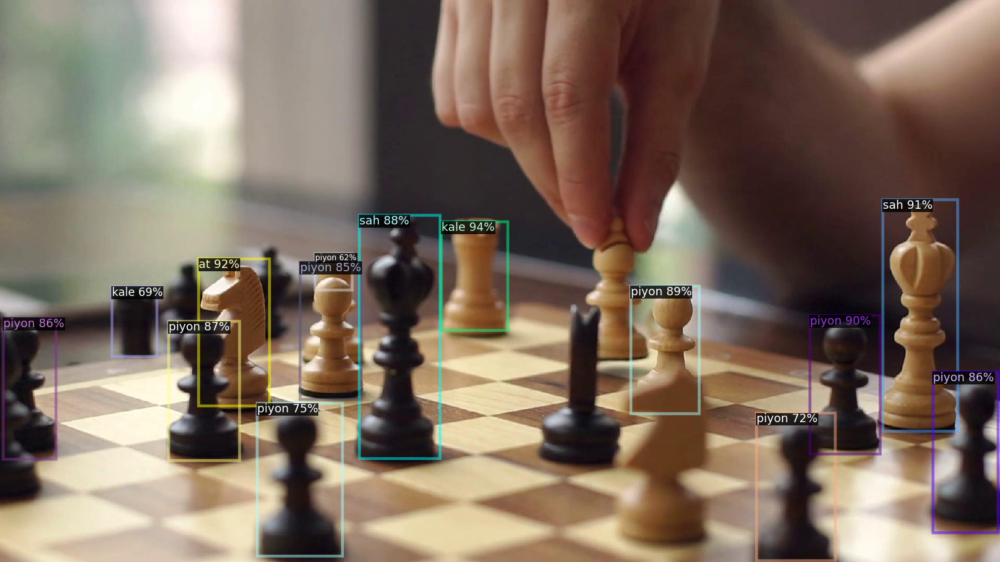

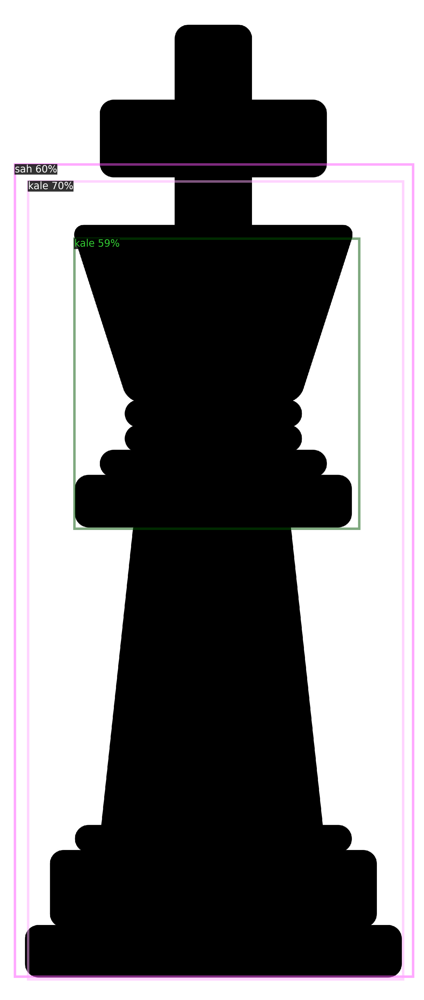

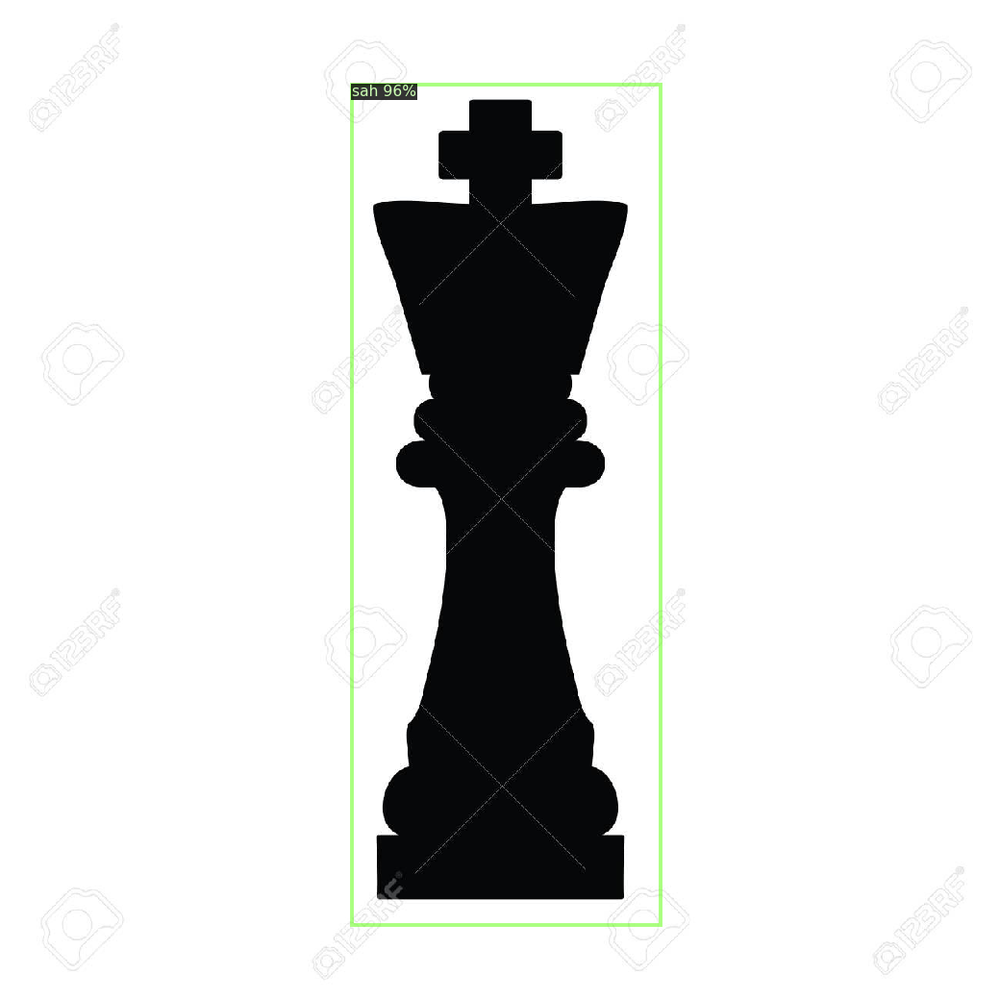

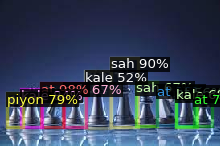

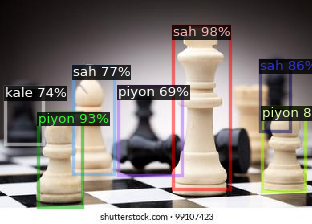

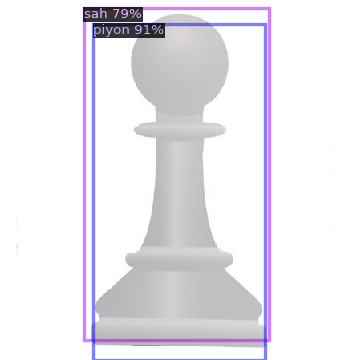

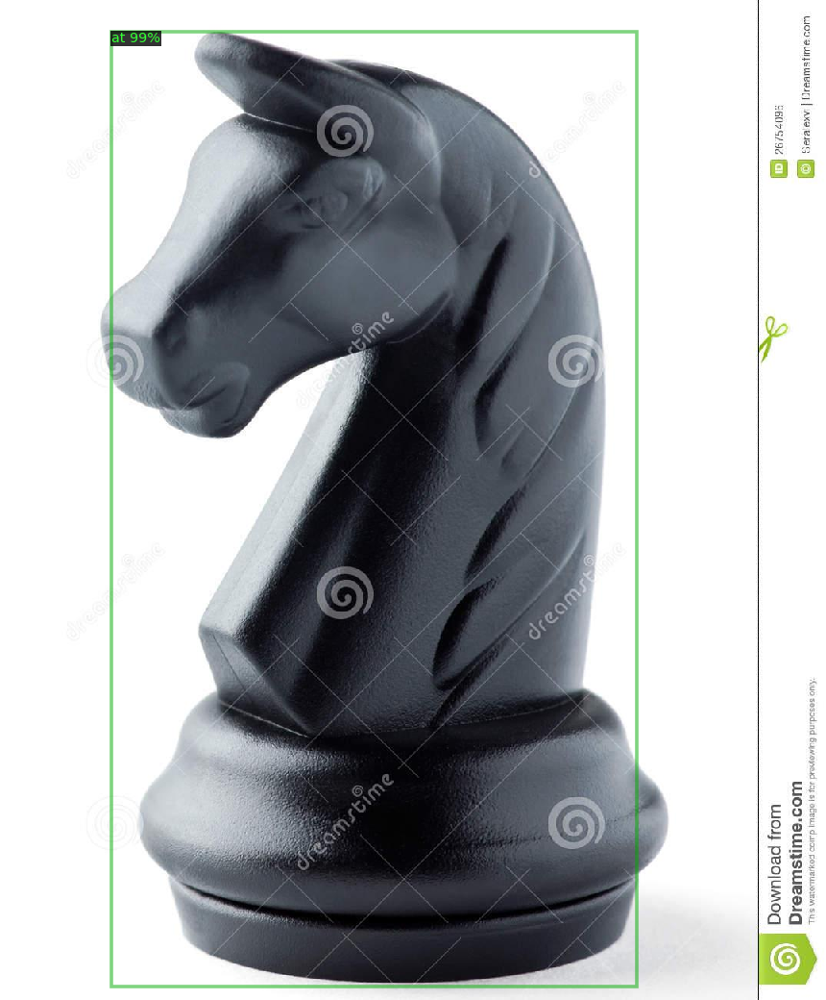

KeyboardInterrupt: 

In [14]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

WARNING [11/27 05:36:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/27 05:36:31 d2.data.datasets.coco]: Loaded 170 images in COCO format from /content/test/_annotations.coco.json
[11/27 05:36:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/27 05:36:31 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/27 05:36:31 d2.data.common]: Serializing 170 elements to byte tensors and concatenating them all ...
[11/27 05:36:31 d2.data.common]: Serialized dataset takes 0.06 MiB
[11/27 05:36:31 d2.evaluation.evaluator]: Start inference on 170 batches
[11/27 05:36:32 d2.evaluation.evaluator]: Inference done 11/170. Dataloading: 0.0016 s/iter. Inference: 0.1056 s/iter. Eval: 0.0003 s/iter. Total: 0.1075 s/iter. ETA=0:00:17
[11/27 05:36:37 d2.evaluation.e

In [ ]:
#Save cfg file

f = open('config.yml','w')
f.write(cfg.dump())
f.close()